In [18]:
# cleaned notebook
%matplotlib notebook
import numpy as np
import operator
import scipy
import math
import scipy.ndimage
import matplotlib.patches
from scipy.spatial import distance
import photutils
import itertools
from photutils import centroid_com
from scipy import ndimage
from scipy import optimize
from scipy.optimize import least_squares
import h5py
import matplotlib
import matplotlib.pyplot as mpl
from matplotlib import pyplot as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable
from scipy.ndimage import gaussian_filter
import cv2
from scipy.ndimage.morphology import binary_fill_holes
import os, re
import sys, time
import skimage
from skimage import morphology
sourcepath = '/Users/niloo/Desktop/SwissFel_2019/data_beamtime/SwissFEL_BERNINA_20181820-master/src'
sys.path.insert(0, sourcepath)
import calibrators
from calibrators import *

In [19]:
import xlsxwriter
import pandas as pd

In [20]:
import import_ipynb
import Final_plots_LCLS
from Final_plots_LCLS import *

In [21]:
filterout_w_abv = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks')
filterout_m_abv = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks')
filterout_c_abv = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks')

In [24]:
large_q_c_abv = [list(d_values(filterout_c_abv, 3))[x]['q_cm'] for x in range(len(list(d_values(filterout_c_abv, 3))))]
large_q_c_abv = np.array(sorted(itertools.chain(*large_q_c_abv))).T

In [25]:
large_q_w_abv = [list(d_values(filterout_w_abv, 3))[t]['q_cm'] for t in range(len(list(d_values(filterout_w_abv, 3))))]
large_q_w_abv = np.array(sorted(itertools.chain(*large_q_w_abv))).T

In [26]:
large_q_m_abv = [list(d_values(filterout_m_abv, 3))[k]['q_cm'] for k in range(len(list(d_values(filterout_m_abv, 3))))]
large_q_m_abv = np.array(sorted(itertools.chain(*large_q_m_abv))).T

In [27]:
zs = [list(filterout_c_abv[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*zs))).T
pershot_c_abv = np.array([len([s for s in fg if n in s]) for n in T_c])

In [28]:
cv = [list(filterout_w_abv[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*cv))).T
pershot_w_abv = np.array([len([s for s in fg if n in s]) for n in T_w])

In [29]:
df = [list(filterout_m_abv[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*df))).T
pershot_m_abv = np.array([len([s for s in fg if n in s]) for n in T_m])

In [30]:
filterout_w_blw = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks')
filterout_m_blw = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks')
filterout_c_blw = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks') 

In [31]:
large_q_c_blw = [list(d_values(filterout_c_blw, 3))[x]['q_cm'] for x in range(len(list(d_values(filterout_c_blw, 3))))]
large_q_c_blw = np.array(sorted(itertools.chain(*large_q_c_blw))).T
time.process_time() 

1540.7885099999999

In [32]:
large_q_w_blw = [list(d_values(filterout_w_blw, 3))[t]['q_cm'] for t in range(len(list(d_values(filterout_w_blw, 3))))]
large_q_w_blw = np.array(sorted(itertools.chain(*large_q_w_blw))).T

In [33]:
large_q_m_blw = [list(d_values(filterout_m_blw, 3))[k]['q_cm'] for k in range(len(list(d_values(filterout_m_blw, 3))))]
large_q_m_blw = np.array(sorted(itertools.chain(*large_q_m_blw))).T

In [34]:
aw = [list(filterout_c_blw[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw = np.array([len([s for s in fg if n in s]) for n in T_c])

In [35]:
qw = [list(filterout_w_blw[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*qw))).T
pershot_w_blw = np.array([len([s for s in fg if n in s]) for n in T_w])

In [36]:
de = [list(filterout_m_blw[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*de))).T
pershot_m_blw = np.array([len([s for s in fg if n in s]) for n in T_m])

In [59]:
from scipy.signal import find_peaks
# for local maxima
find_peaks((new_q_cm_w/pershot_w_abv.sum()), height = 0.05)

(array([162, 168, 172, 175, 178, 182, 234, 277, 302, 321, 325]),
 {'peak_heights': array([0.42940039, 0.11411992, 0.19245648, 0.11702128, 0.12862669,
         0.18181818, 0.14313346, 0.14119923, 0.06673114, 0.06576402,
         0.07156673])})

<IPython.core.display.Javascript object>


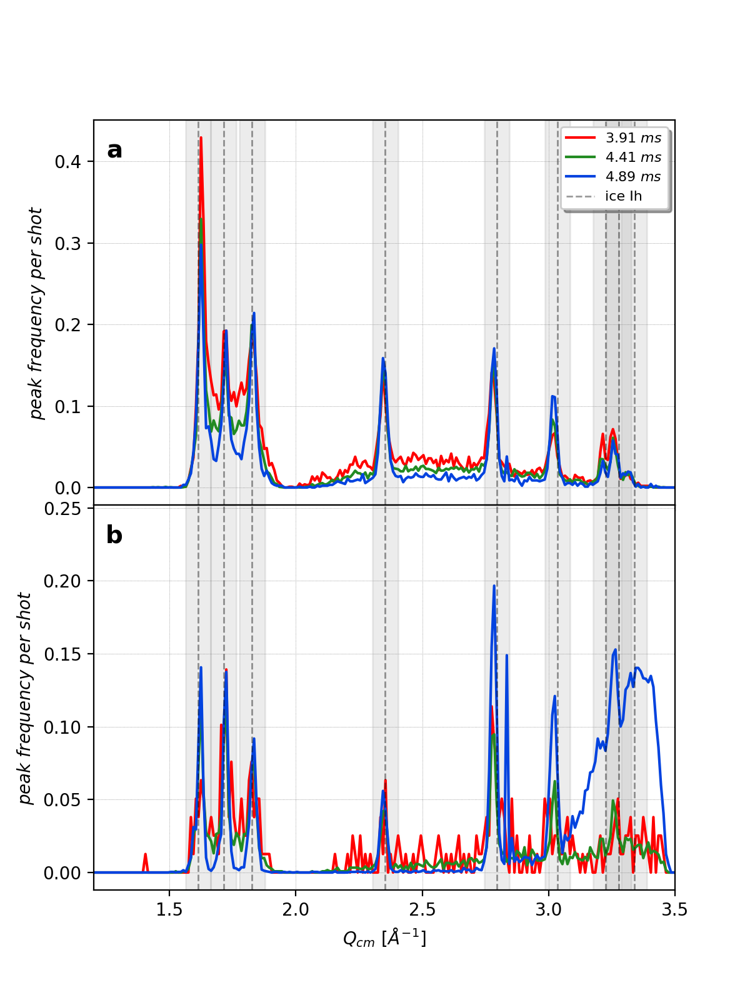

In [73]:
# peak numbers vs q_cm center of mass in q scale
fig, (ax1, ax2) = plt.subplots(2,ncols=1, sharex=True, figsize = [6,8])
# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,5.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(large_q_w_abv, bins=binedges)
yhist_m, bin_edges_m = np.histogram(large_q_m_abv, bins=binedges)
yhist_c, bin_edges_c = np.histogram(large_q_c_abv, bins=binedges)

yhist_w_blw, bin_edges_w_blw = np.histogram(large_q_w_blw, bins=binedges)
yhist_m_blw, bin_edges_m_blw = np.histogram(large_q_m_blw, bins=binedges)
yhist_c_blw, bin_edges_c_blw = np.histogram(large_q_c_blw, bins=binedges)

bin_centers_w = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers_m = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers_c = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers_w_blw = np.array([(bin_edges_w_blw[i] + bin_edges_w_blw[i+1])/2 for i in range(len(bin_edges_w_blw)-1)])
bin_centers_m_blw = np.array([(bin_edges_m_blw[i] + bin_edges_m_blw[i+1])/2 for i in range(len(bin_edges_m_blw)-1)])
bin_centers_c_blw = np.array([(bin_edges_c_blw[i] + bin_edges_c_blw[i+1])/2 for i in range(len(bin_edges_c_blw)-1)])

new_bins, new_q_cm_w = downsample(bin_centers_w, yhist_w, size=10)
new_bins, new_q_cm_m = downsample(bin_centers_m, yhist_m, size=10)
new_bins, new_q_cm_c = downsample(bin_centers_c, yhist_c, size=10)

new_bins_blw, new_q_blw_w = downsample(bin_centers_w_blw, yhist_w_blw, size=10)
new_bins_blw, new_q_blw_m = downsample(bin_centers_m_blw, yhist_m_blw, size=10)
new_bins_blw, new_q_blw_c = downsample(bin_centers_c_blw, yhist_c_blw, size=10)

T_229, = ax1.plot(new_bins, (new_q_cm_w/pershot_w_abv.sum()),  color='r')
T_228, = ax1.plot(new_bins, (new_q_cm_m/pershot_m_abv.sum()),  color='forestgreen')
T_227, = ax1.plot(new_bins, (new_q_cm_c/pershot_c_abv.sum()),  color='#0343DF')

T_229_blw, = ax2.plot(new_bins_blw, (new_q_blw_w/pershot_w_blw.sum()),  color='r')
T_228_blw, = ax2.plot(new_bins_blw, (new_q_blw_m/pershot_m_blw.sum()),  color='forestgreen')
T_227_blw, = ax2.plot(new_bins_blw, (new_q_blw_c/pershot_c_blw.sum()),  color='#0343DF')

xposition = iceIh_peaks()
for x,xc in enumerate(xposition[:-1]):
    ice_plot = ax1.axvline(x=xc, color='k', linestyle='--', lw=1, alpha=0.4)
    plt_fill = ax1.axvspan(xc-0.05, xc+0.05, alpha=0.15, color='gray')
    ice_plot2 = ax2.axvline(x=xc, color='k', linestyle='--', lw=1, alpha=0.4)
    plt_fill2 = ax2.axvspan(xc-0.05, xc+0.05, alpha=0.15, color='gray')
    
ax1.legend(handles=[T_229, T_228, T_227, ice_plot], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$', 'ice Ih'], loc='upper right', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
#ax1.legend(handles=[T_227, T_228, T_229, ice_plot], labels=['$4.89\ ms$', '$4.41\ ms$', '$3.91\ ms$', 'ice Ih'], loc='upper right', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$Q_{cm}\ [\AA^{-1}]$')
ax1.text(0.05, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
ax1.set_xlim(1.2, 3.5)
#ax1.set_ylim(0, 46)
#plt.title('Above 50 ADUs')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)

#ax2.legend(handles=[T_227_blw, T_228_blw, T_229_blw, ice_plot2], labels=['50 mm', '45 mm', '40 mm', 'ice Ih'], loc='upper right', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$Q_{cm}\ [\AA^{-1}]$')
ax2.text(0.05, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
ax2.set_xlim(1.2, 3.5)
#ax2.set_ylim(0, 23)
#plt.title('Above 50 ADUs')
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
#ax1.set_rasterized(True)
#ax2.set_rasterized(True)
#ax1.set_rasterization_zorder(1)
#ax2.set_rasterization_zorder(1)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/Fig3.pdf', format='pdf')
#plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/Fig3.eps', format='eps', rasterized=True)
plt.show() 

In [62]:

workbook = xlsxwriter.Workbook('data_fig3a.xlsx')
worksheet = workbook.add_worksheet()
workbook.close()
df = pd.read_excel('data_fig3a.xlsx')
df['q_cm'] = pd.Series(new_bins)
df['P_w'] = pd.Series((new_q_cm_w/pershot_w_abv.sum())*100)
df['P_m'] = pd.Series((new_q_cm_m/pershot_m_abv.sum())*100)
df['P_c'] = pd.Series((new_q_cm_c/pershot_c_abv.sum())*100)
df.to_excel('data_fig3a.xlsx')

workbook = xlsxwriter.Workbook('data_fig3b.xlsx')
worksheet = workbook.add_worksheet()
workbook.close()
df = pd.read_excel('data_fig3b.xlsx')
df['q_cm'] = pd.Series(new_bins_blw)
df['P_w'] = pd.Series((new_q_blw_w/pershot_w_blw.sum())*100)
df['P_m'] = pd.Series((new_q_blw_m/pershot_m_blw.sum())*100)
df['P_c'] = pd.Series((new_q_blw_c/pershot_c_blw.sum())*100)
df.to_excel('data_fig3b.xlsx')


In [63]:
dict_all_w = Shot_for_sp(T_w, above_50ADUs_w, area_thr = 10, choice = 'large_peaks')
dict_all_m = Shot_for_sp(T_m, above_50ADUs_m, area_thr = 10, choice = 'large_peaks')
dict_all_c = Shot_for_sp(T_c, above_50ADUs_c, area_thr = 10, choice = 'large_peaks')

In [64]:
aw = [list(dict_all_m[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_dict_all_m = np.array([len([s for s in fg if n in s]) for n in T_m])

In [65]:
aw = [list(dict_all_w[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_dict_all_w = np.array([len([s for s in fg if n in s]) for n in T_w])

In [66]:
aw = [list(dict_all_c[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_dict_all_c = np.array([len([s for s in fg if n in s]) for n in T_c])

In [67]:
def filterTheDict_d(input_dict, d_min_thr = 0., d_max_thr = 9):
    newDict = []
    for run in input_dict.keys():
        for shot in input_dict[run]:
            for peak in input_dict[run][shot]:
                d_all = input_dict[run][shot][peak]['all_distances'][0]
                for i in d_all:
                    try:
                        if ((i >= d_min_thr) & (i < d_max_thr)):
                            newDict.append((shot,peak))
                    except TypeError:
                        print(run, shot, peak, i)
                #try:
                #    if ((input_dict[run][shot][peak]['min_distance'][0] >= d_min_thr) & (input_dict[run][shot][peak]['min_distance'][0] < d_max_thr)):
                #        newDict[run][shot][peak] = {}
                #        newDict[run][shot][peak] = input_dict[run][shot][peak]
                #except:
                #    pass
                #except TypeError:
                    #print(run, shot, peak, input_dict[run][shot][peak])
                    
    return newDict

In [68]:
def filterTheDict_mind(input_dict, d_min_thr = 0., d_max_thr = 9):
    newDict = []
    for run in input_dict.keys():
        for shot in input_dict[run]:
            for peak in input_dict[run][shot]:
                min_d = input_dict[run][shot][peak]['min_distance'][0]
                try:
                    if ((min_d >= d_min_thr) & (min_d < d_max_thr)):
                        newDict.append((shot,peak))
                except TypeError:
                    print(run, shot, peak)
    return newDict

In [69]:
dict_all_w_d_min = [list(d_values(dict_all_w, 3))[x]['min_distance'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_d_min = [list(d_values(dict_all_m, 3))[x]['min_distance'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_d_min = [list(d_values(dict_all_c, 3))[x]['min_distance'] for x in range(len(list(d_values(dict_all_c, 3))))]

dict_all_w_d = [list(d_values(dict_all_w, 3))[x]['all_distances'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_d = [list(d_values(dict_all_m, 3))[x]['all_distances'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_d = [list(d_values(dict_all_c, 3))[x]['all_distances'] for x in range(len(list(d_values(dict_all_c, 3))))]
time.process_time() 

2592.38764

<IPython.core.display.Javascript object>


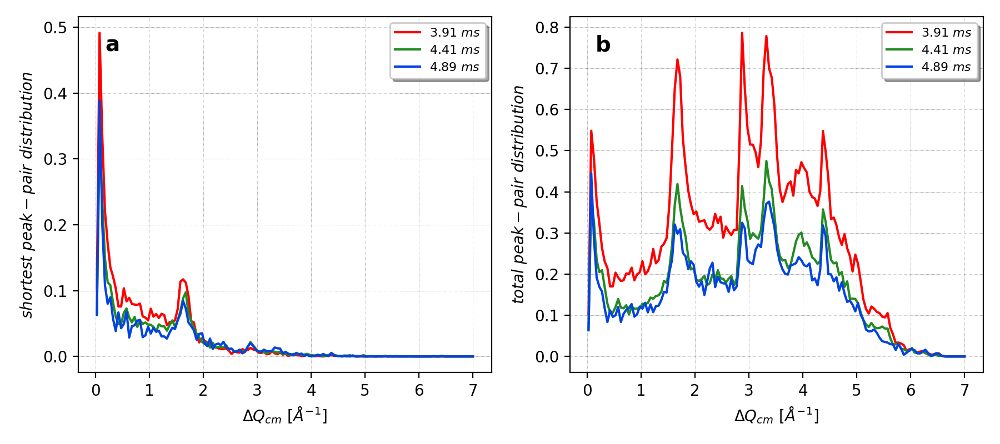

In [107]:
# min_d and d with Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [9,4])
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # left side
binwidth = 0.005
binedges = np.arange(0-binwidth/2,7.+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(np.column_stack(dict_all_w_d_min)[0], bins=binedges)
yhist_m, bin_edges_m = np.histogram(np.column_stack(dict_all_m_d_min)[0], bins=binedges)
yhist_c, bin_edges_c = np.histogram(np.column_stack(dict_all_c_d_min)[0], bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(np.column_stack(dict_all_w_d)[0], bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(np.column_stack(dict_all_m_d)[0], bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(np.column_stack(dict_all_c_d)[0], bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_d_w = downsample(bin_centers1, yhist_w/2, size=10)
new_bins, new_d_m = downsample(bin_centers2, yhist_m/2, size=10)
new_bins, new_d_c = downsample(bin_centers3, yhist_c/2, size=10)

new_bins_log, new_d_w_min = downsample(bin_centers1_log, yhist_w_log/2, size=10)
new_bins_log, new_d_m_min = downsample(bin_centers2_log, yhist_m_log/2, size=10)
new_bins_log, new_d_c_min = downsample(bin_centers3_log, yhist_c_log/2, size=10)

T_229, = ax1.plot(new_bins, (new_d_w/pershot_dict_all_w.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_d_m/pershot_dict_all_m.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_d_c/pershot_dict_all_c.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins, (new_d_w_min/pershot_dict_all_w.sum()), color='r')
T_228_1, = ax2.plot(new_bins, (new_d_m_min/pershot_dict_all_m.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins, (new_d_c_min/pershot_dict_all_c.sum()), color='#0343DF')

ax1.text(0.1, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
ax2.text(0.1, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper right', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$\Delta Q_{cm}\ [\AA^{-1}] $')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$shortest\ peak-pair\ distribution$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)

ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$','$4.41\ ms$','$4.89\ ms$'], loc='upper right', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$\Delta Q_{cm}\ [\AA^{-1}]$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$total\ peak-pair\ distribution$')
#ax1.set_xlim(-0.1, 6.5)
#ax2.set_xlim(-0.1, 7)
#ax2.set_title('Above 50 ADUs')
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
fig.tight_layout()
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/Fig4.pdf', format='pdf')
plt.show()  

In [165]:
'''
p1 = list(set(filterTheDict_d(dict_all_w, 0.05, 0.25)))
p2 = list(set(filterTheDict_d(dict_all_w, 1.5, 1.9)))
p3 = list(set(filterTheDict_d(dict_all_w, 2.8, 2.95)))
p4 = list(set(filterTheDict_d(dict_all_w, 3.2, 3.5)))
p5 = list(set(filterTheDict_d(dict_all_w, 4.35, 4.45)))
'''

'\np1 = list(set(filterTheDict_d(dict_all_w, 0.05, 0.25)))\np2 = list(set(filterTheDict_d(dict_all_w, 1.5, 1.9)))\np3 = list(set(filterTheDict_d(dict_all_w, 2.8, 2.95)))\np4 = list(set(filterTheDict_d(dict_all_w, 3.2, 3.5)))\np5 = list(set(filterTheDict_d(dict_all_w, 4.35, 4.45)))\n'

In [136]:
intersection = set(p1).intersection(p2) #Find common elements of set and list.
intersection_p12 = list(intersection)

In [137]:
intersection = set(intersection_p12).intersection(p3) #Find common elements of set and list.
intersection_p123 = list(intersection)

In [138]:
intersection = set(intersection_p123).intersection(p4) #Find common elements of set and list.
intersection_p1234 = list(intersection)

In [139]:
intersection = set(intersection_p1234).intersection(p5) #Find common elements of set and list.
intersection_p12345 = list(intersection)

In [143]:
import random
random.sample(intersection_p12345, k=20)

['LCLS_2011_Mar01_r0169_012807_18d6e_cspad',
 'LCLS_2011_Feb28_r0147_173734_6cdb_cspad',
 'LCLS_2011_Feb28_r0147_180025_1f46d_cspad',
 'LCLS_2011_Feb28_r0147_174839_1356_cspad',
 'LCLS_2011_Feb28_r0147_173346_12c1e_cspad',
 'LCLS_2011_Feb28_r0147_175134_10a76_cspad',
 'LCLS_2011_Feb28_r0144_163548_1149_cspad',
 'LCLS_2011_Feb28_r0147_181256_142e_cspad',
 'LCLS_2011_Feb28_r0147_181336_4ce0_cspad',
 'LCLS_2011_Mar01_r0169_014402_cbca_cspad',
 'LCLS_2011_Mar01_r0170_015730_13c74_cspad',
 'LCLS_2011_Mar01_r0170_020106_6c03_cspad',
 'LCLS_2011_Feb28_r0147_174120_1a9f4_cspad',
 'LCLS_2011_Feb28_r0147_181414_82a4_cspad',
 'LCLS_2011_Mar01_r0169_014104_1d226_cspad',
 'LCLS_2011_Feb28_r0144_163533_1fb33_cspad',
 'LCLS_2011_Feb28_r0151_183323_d14f_cspad',
 'LCLS_2011_Feb28_r0147_175446_175b_cspad',
 'LCLS_2011_Feb28_r0147_174518_f8fa_cspad',
 'LCLS_2011_Feb28_r0144_163901_11fa9_cspad']

In [259]:
dict_all_w['r0144']['LCLS_2011_Feb28_r0144_163006_2feb_cspad']['peak11']

{'q_cm': array([1.92402644]),
 'Otsu_sphericity': 0.8040483770206226,
 'Otsu_area': 20.5,
 'Otsu_perimeter': 17.899494767189026,
 'Otsu_max_intensity': 0.5606634763852383,
 'Otsu_Number_of_maxima': 1,
 'log-Otsu_sphericity': 0.6750211692006682,
 'log-Otsu_area': 96.5,
 'log-Otsu_perimeter': 42.38477599620819,
 'log-Otsu_max_intensity': 0.9074003135276576,
 'log-Otsu_Number_of_maxima': 1,
 'all_distances': [array([0.53364114, 2.03108584, 1.24478676, 1.26576834, 2.30890643,
         3.21800949, 2.91287124, 3.0155963 , 3.09087447, 3.59937917])],
 'min_distance': [0.533641138555012]}

In [329]:
pmin_1 = filterTheDict_mind(dict_all_w, 1.55, 1.75)

r0151 LCLS_2011_Feb28_r0151_183057_4a1_cspad peak0
r0151 LCLS_2011_Feb28_r0151_183408_1117b_cspad peak0
r0169 LCLS_2011_Mar01_r0169_014128_1f2de_cspad peak0
r0169 LCLS_2011_Mar01_r0169_014048_1bb97_cspad peak0
r0169 LCLS_2011_Mar01_r0169_014754_11e2_cspad peak0
r0169 LCLS_2011_Mar01_r0169_014004_17d81_cspad peak0
r0170 LCLS_2011_Mar01_r0170_020314_1209f_cspad peak0
r0170 LCLS_2011_Mar01_r0170_020338_141c3_cspad peak0
r0170 LCLS_2011_Mar01_r0170_020311_11b71_cspad peak0


In [330]:
random.sample(list(Counter(pmin_1)), k=20)

[('LCLS_2011_Mar01_r0169_013902_12696_cspad', 'peak2'),
 ('LCLS_2011_Feb28_r0147_173808_9d2f_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0151_182227_136f2_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0151_182231_13dd6_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0151_182544_4d43_cspad', 'peak0'),
 ('LCLS_2011_Mar01_r0170_020401_1624b_cspad', 'peak6'),
 ('LCLS_2011_Feb28_r0145_164636_19f6e_cspad', 'peak3'),
 ('LCLS_2011_Feb28_r0151_182530_38a3_cspad', 'peak4'),
 ('LCLS_2011_Mar01_r0169_013614_39c6_cspad', 'peak5'),
 ('LCLS_2011_Mar01_r0169_014057_1c85a_cspad', 'peak2'),
 ('LCLS_2011_Feb28_r0144_163215_e538_cspad', 'peak0'),
 ('LCLS_2011_Mar01_r0169_014237_53ee_cspad', 'peak1'),
 ('LCLS_2011_Mar01_r0170_020405_1678b_cspad', 'peak5'),
 ('LCLS_2011_Mar01_r0169_014000_177e7_cspad', 'peak6'),
 ('LCLS_2011_Feb28_r0144_163415_18d6e_cspad', 'peak0'),
 ('LCLS_2011_Mar01_r0169_014615_186d8_cspad', 'peak9'),
 ('LCLS_2011_Feb28_r0147_181435_9f72_cspad', 'peak2'),
 ('LCLS_2011_Mar01_r0169_014402_cbca_cspad', 'peak3'),


In [15]:
import random
random.sample(list(Counter(p1)), k=20)

[('LCLS_2011_Feb28_r0151_183553_1a4ab_cspad', 'peak7'),
 ('LCLS_2011_Mar01_r0169_014104_1d226_cspad', 'peak5'),
 ('LCLS_2011_Mar01_r0169_014939_a5f6_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0151_182516_24bd_cspad', 'peak3'),
 ('LCLS_2011_Mar01_r0169_015632_ea48_cspad', 'peak2'),
 ('LCLS_2011_Mar01_r0170_020011_1f9b_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0147_175147_11bec_cspad', 'peak5'),
 ('LCLS_2011_Feb28_r0151_183556_1a8c2_cspad', 'peak4'),
 ('LCLS_2011_Feb28_r0151_182457_b10_cspad', 'peak11'),
 ('LCLS_2011_Mar01_r0169_014207_29f7_cspad', 'peak4'),
 ('LCLS_2011_Feb28_r0151_182605_6aaa_cspad', 'peak2'),
 ('LCLS_2011_Mar01_r0169_012918_1f07d_cspad', 'peak11'),
 ('LCLS_2011_Feb28_r0144_163703_7a58_cspad', 'peak1'),
 ('LCLS_2011_Mar01_r0169_013123_a0c2_cspad', 'peak2'),
 ('LCLS_2011_Feb28_r0147_180605_1d361_cspad', 'peak4'),
 ('LCLS_2011_Mar01_r0170_020106_6be2_cspad', 'peak5'),
 ('LCLS_2011_Mar01_r0169_015458_6675_cspad', 'peak1'),
 ('LCLS_2011_Mar01_r0169_013444_1bb67_cspad', 'peak8'),
 (

In [11]:
p1 = filterTheDict_d(dict_all_w, 0.05, 0.25)
p2 = filterTheDict_d(dict_all_w, 1.5, 1.9)
p3 = filterTheDict_d(dict_all_w, 2.8, 2.95)
p4 = filterTheDict_d(dict_all_w, 3.2, 3.5)
p5 = filterTheDict_d(dict_all_w, 4.35, 4.45)

In [14]:
from collections import Counter
p5_f= []
for (key,value) in Counter(p5).items():
    if value>=3:
        p5_f.append(key)

In [352]:
max(Counter(p5).values())

5

In [354]:
p5_f

[('LCLS_2011_Feb28_r0144_163149_c087_cspad', 'peak2'),
 ('LCLS_2011_Feb28_r0145_170752_a266_cspad', 'peak6'),
 ('LCLS_2011_Feb28_r0145_165411_201c_cspad', 'peak4'),
 ('LCLS_2011_Feb28_r0145_164616_18321_cspad', 'peak7'),
 ('LCLS_2011_Feb28_r0146_173229_bfc1_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0146_173229_bfc1_cspad', 'peak5'),
 ('LCLS_2011_Feb28_r0146_173229_bfc1_cspad', 'peak11'),
 ('LCLS_2011_Feb28_r0146_173229_bfc1_cspad', 'peak13'),
 ('LCLS_2011_Feb28_r0147_175120_f579_cspad', 'peak14'),
 ('LCLS_2011_Feb28_r0147_175855_1763a_cspad', 'peak3'),
 ('LCLS_2011_Feb28_r0147_173906_edd8_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0147_175600_8004_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0147_175600_8004_cspad', 'peak13'),
 ('LCLS_2011_Feb28_r0147_181435_9f72_cspad', 'peak2'),
 ('LCLS_2011_Feb28_r0147_175053_cfc0_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0147_174518_f8fa_cspad', 'peak1'),
 ('LCLS_2011_Feb28_r0147_181336_4ce0_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0147_174456_d9dd_cspad', 'peak8'),
 ('L

In [264]:
Counter(p2)[('LCLS_2011_Feb28_r0144_163006_2feb_cspad', 'peak1')]

4

In [333]:
Counter(p3)

Counter({('LCLS_2011_Feb28_r0144_163109_880b_cspad', 'peak1'): 1,
         ('LCLS_2011_Feb28_r0144_163109_880b_cspad', 'peak3'): 1,
         ('LCLS_2011_Feb28_r0144_163109_880b_cspad', 'peak4'): 1,
         ('LCLS_2011_Feb28_r0144_163109_880b_cspad', 'peak7'): 1,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak2'): 2,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak3'): 2,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak4'): 2,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak5'): 1,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak6'): 2,
         ('LCLS_2011_Feb28_r0144_163315_13941_cspad', 'peak7'): 1,
         ('LCLS_2011_Feb28_r0144_163533_1fb33_cspad', 'peak6'): 1,
         ('LCLS_2011_Feb28_r0144_163533_1fb33_cspad', 'peak8'): 1,
         ('LCLS_2011_Feb28_r0144_163533_1fb33_cspad', 'peak11'): 2,
         ('LCLS_2011_Feb28_r0144_163320_1409a_cspad', 'peak6'): 1,
         ('LCLS_2011_Feb28_r0144_163320_1409a_cspad', 'peak8'): 2

In [335]:
random.sample(p3_f, k=2)

[('LCLS_2011_Mar01_r0169_013444_1bb67_cspad', 'peak0'),
 ('LCLS_2011_Feb28_r0147_173654_3522_cspad', 'peak16')]

In [108]:
filterout_w_abv_s = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)
filterout_m_abv_s = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)
filterout_c_abv_s = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)

KeyboardInterrupt: 

In [ ]:
filterout_w_blw_s = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)
filterout_m_blw_s = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)
filterout_c_blw_s = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm=1.5, upper_qcm= 2)

In [ ]:
# sphericity with different methods
dict_abv_w_s_ots = [list(d_values(filterout_w_abv_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s, 3))))]
dict_abv_m_s_ots = [list(d_values(filterout_m_abv_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s, 3))))]
dict_abv_c_s_ots = [list(d_values(filterout_c_abv_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s, 3))))]

dict_abv_w_s_log = [list(d_values(filterout_w_abv_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s, 3))))]
dict_abv_m_s_log = [list(d_values(filterout_m_abv_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s, 3))))]
dict_abv_c_s_log = [list(d_values(filterout_c_abv_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s, 3))))]


In [ ]:

# sphericity with different methods
dict_blw_w_s_ots = [list(d_values(filterout_w_blw_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s, 3))))]
dict_blw_m_s_ots = [list(d_values(filterout_m_blw_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s, 3))))]
dict_blw_c_s_ots = [list(d_values(filterout_c_blw_s, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s, 3))))]

dict_blw_w_s_log = [list(d_values(filterout_w_blw_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s, 3))))]
dict_blw_m_s_log = [list(d_values(filterout_m_blw_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s, 3))))]
dict_blw_c_s_log = [list(d_values(filterout_c_blw_s, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s, 3))))]



In [78]:
aw = [list(filterout_w_blw_s[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s = np.array([len([s for s in fg if n in s]) for n in T_w])

In [79]:
aw = [list(filterout_w_abv_s[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s = np.array([len([s for s in fg if n in s]) for n in T_w])

In [80]:
aw = [list(filterout_m_blw_s[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s = np.array([len([s for s in fg if n in s]) for n in T_m])

In [81]:
aw = [list(filterout_m_abv_s[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s = np.array([len([s for s in fg if n in s]) for n in T_m])

In [82]:
aw = [list(filterout_c_blw_s[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s = np.array([len([s for s in fg if n in s]) for n in T_c])

In [83]:
aw = [list(filterout_c_abv_s[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s = np.array([len([s for s in fg if n in s]) for n in T_c])

In [84]:
len(dict_abv_w_s_log), len(bin_edges_w_log)

(4448, 1402)

<IPython.core.display.Javascript object>


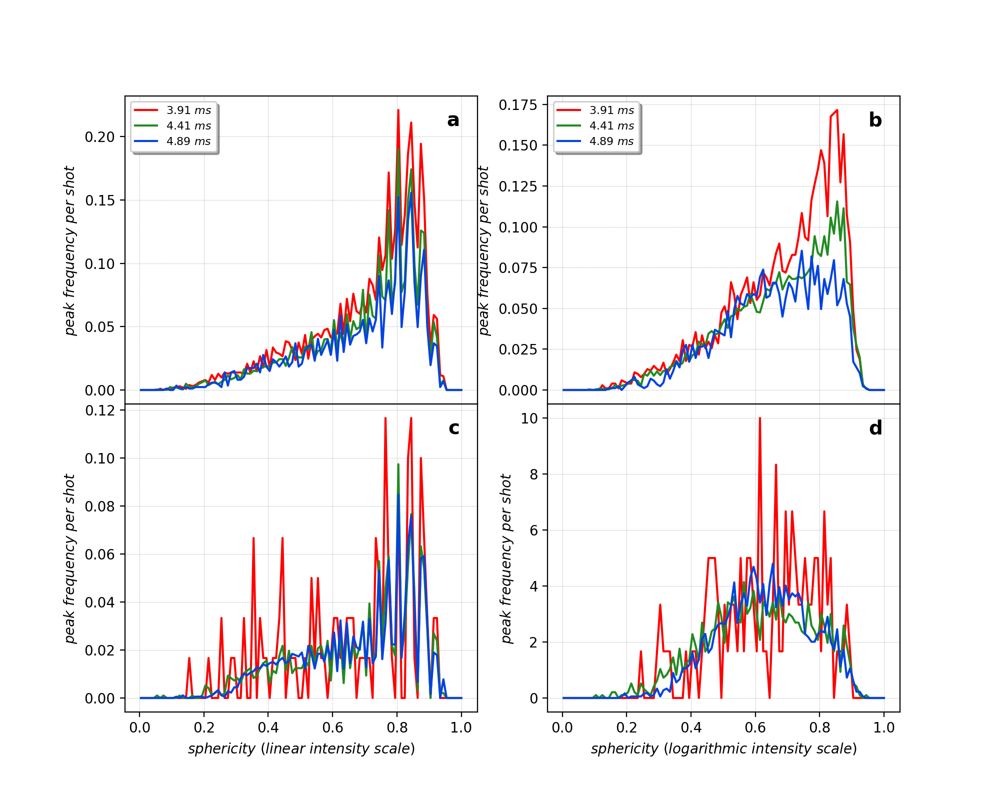

In [105]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(dict_abv_w_s_ots, bins=binedges)
yhist_m, bin_edges_m = np.histogram(dict_abv_m_s_ots, bins=binedges)
yhist_c, bin_edges_c = np.histogram(dict_abv_c_s_ots, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(dict_abv_w_s_log, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(dict_abv_m_s_log, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(dict_abv_c_s_log, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(dict_blw_w_s_ots, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(dict_blw_m_s_ots, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(dict_blw_c_s_ots, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(dict_blw_w_s_log, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(dict_blw_m_s_log, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(dict_blw_c_s_log, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s.sum()), color='#0343DF')


T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s.sum()), color='#0343DF')


T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s.sum())*100, color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s.sum())*100, color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s.sum())*100, color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale) $')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax2.set_title('Above 50 ADUs, log-Otsu method')
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/Fig5.pdf', format='pdf')
plt.show()  

In [91]:
def filterTheDict_case1(input_dict, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0., d_max_thr = 9):
    newDict ={}
    for run in input_dict.keys():
        newDict[run] ={}
        for shot in input_dict[run]:
            newDict[run][shot] ={}
            for peak in input_dict[run][shot]:
                min_d = input_dict[run][shot][peak]['min_distance'][0]
                try:
                    if (((min_d >= d_min_thr) & (min_d < d_max_thr)) & ((input_dict[run][shot][peak]['Otsu_sphericity'] >= s_min_thr) & (input_dict[run][shot][peak]['Otsu_sphericity'] < s_max_thr)) & (input_dict[run][shot][peak]['Otsu_Number_of_maxima'] == 1)):
                        newDict[run][shot][peak] = {}
                        newDict[run][shot][peak] = input_dict[run][shot][peak]
                except TypeError:
                    pass
                    #print(run, shot, peak)                            
    return newDict

In [92]:
def filterTheDict_case2(input_dict, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0., d_max_thr = 9):
    newDict ={}
    for run in input_dict.keys():
        newDict[run] ={}
        for shot in input_dict[run]:
            newDict[run][shot] ={}
            for peak in input_dict[run][shot]:
                min_d = input_dict[run][shot][peak]['min_distance'][0]
                try:
                    if (((min_d >= d_min_thr) & (min_d < d_max_thr)) & (input_dict[run][shot][peak]['Otsu_Number_of_maxima'] == 1)):
                        if ((input_dict[run][shot][peak]['Otsu_sphericity'] >= s_min_thr) & (input_dict[run][shot][peak]['Otsu_sphericity'] < s_max_thr)) or ((input_dict[run][shot][peak]['log-Otsu_sphericity'] >= s_min_thr) & (input_dict[run][shot][peak]['log-Otsu_sphericity'] < s_max_thr)):  
                            newDict[run][shot][peak] = {}
                            newDict[run][shot][peak] = input_dict[run][shot][peak]
                except TypeError:
                    pass
                    #print(run, shot, peak)                            
    return newDict

In [93]:
def filterTheDict_case3(input_dict, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0., d_max_thr = 9):
    newDict ={}
    for run in input_dict.keys():
        newDict[run] ={}
        for shot in input_dict[run]:
            newDict[run][shot] ={}
            for peak in input_dict[run][shot]:
                min_d = input_dict[run][shot][peak]['min_distance'][0]
                try:
                    if (((min_d >= d_min_thr) & (min_d < d_max_thr)) & ((input_dict[run][shot][peak]['Otsu_sphericity'] >= s_min_thr) & (input_dict[run][shot][peak]['Otsu_sphericity'] < s_max_thr)) & (input_dict[run][shot][peak]['Otsu_Number_of_maxima'] > 1)):
                        newDict[run][shot][peak] = {}
                        newDict[run][shot][peak] = input_dict[run][shot][peak]
                except TypeError:
                    pass
                    #print(run, shot, peak)                            
    return newDict

In [94]:
def filter_q_range(input_dict, min_qrange = 0, max_qrange = 10):
    newDict ={}
    for run in input_dict.keys():
        newDict[run] ={}
        for shot in input_dict[run]:
            newDict[run][shot] ={}
            for peak in input_dict[run][shot]:
                peak_q = input_dict[run][shot][peak]['q_cm']
                if ((peak_q >= min_qrange) & (peak_q < max_qrange)):
                        newDict[run][shot][peak] = {}
                        newDict[run][shot][peak] = input_dict[run][shot][peak]                         
    return newDict

In [95]:
case1_w = filterTheDict_case1(dict_all_w, s_min_thr = 0.7, s_max_thr = 1.1, d_min_thr = 0.2, d_max_thr = 9)
case1_m = filterTheDict_case1(dict_all_m, s_min_thr = 0.7, s_max_thr = 1.1, d_min_thr = 0.2, d_max_thr = 9)
case1_c = filterTheDict_case1(dict_all_c, s_min_thr = 0.7, s_max_thr = 1.1, d_min_thr = 0.2, d_max_thr = 9)

In [96]:
case2_w = filterTheDict_case2(dict_all_w, s_min_thr = 0, s_max_thr = 0.3, d_min_thr = 0.2, d_max_thr = 9)
case2_m = filterTheDict_case2(dict_all_m, s_min_thr = 0, s_max_thr = 0.3, d_min_thr = 0.2, d_max_thr = 9)
case2_c = filterTheDict_case2(dict_all_c, s_min_thr = 0, s_max_thr = 0.3, d_min_thr = 0.2, d_max_thr = 9)

In [97]:
case2_abv_w = [list(d_values(case2_w, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_w, 3))))]
case2_abv_m = [list(d_values(case2_m, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_m, 3))))]
case2_abv_c = [list(d_values(case2_c, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_c, 3))))]

In [98]:
min_bound = iceIh_peaks()[6]-0.05
max_bound = iceIh_peaks()[8]+0.05
case2_abv_w_002 = filter_q_range(case2_w, min_qrange = min_bound, max_qrange = max_bound)
case2_abv_m_002 = filter_q_range(case2_m, min_qrange = min_bound, max_qrange = max_bound)
case2_abv_c_002 = filter_q_range(case2_c, min_qrange = min_bound, max_qrange = max_bound)

In [99]:
case2_abv_w002 = [list(d_values(case2_abv_w_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_abv_w_002, 3))))]
case2_abv_m002 = [list(d_values(case2_abv_m_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_abv_m_002, 3))))]
case2_abv_c002 = [list(d_values(case2_abv_c_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case2_abv_c_002, 3))))]

In [100]:
# case 4 only 1 maxima but pcf<0.2 (n_maxima=1)
case4_w = filterTheDict_case1(dict_all_w, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m = filterTheDict_case1(dict_all_m, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c = filterTheDict_case1(dict_all_c, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)

In [101]:
# multiple maxima
case3_w = filterTheDict_case3(dict_all_w, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 9)
case3_m = filterTheDict_case3(dict_all_m, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 9)
case3_c = filterTheDict_case3(dict_all_c, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 9)

In [102]:
min_bound = iceIh_peaks()[2]-0.05
max_bound = iceIh_peaks()[2]+0.05
case1_w_101 = filter_q_range(case1_w, min_qrange = min_bound, max_qrange = max_bound)
case1_w_101_ = [list(d_values(case1_w_101, 3))[x]['q_cm'] for x in range(len(list(d_values(case1_w_101, 3))))]

case1_m_101 = filter_q_range(case1_m, min_qrange = min_bound, max_qrange = max_bound)
case1_m_101_ = [list(d_values(case1_m_101, 3))[x]['q_cm'] for x in range(len(list(d_values(case1_m_101, 3))))]

case1_c_101 = filter_q_range(case1_c, min_qrange = min_bound, max_qrange = max_bound)
case1_c_101_ = [list(d_values(case1_c_101, 3))[x]['q_cm'] for x in range(len(list(d_values(case1_c_101, 3))))]

In [103]:
# sphericity with different methods
dict_all_w_s_ots = [list(d_values(dict_all_w, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_s_ots = [list(d_values(dict_all_m, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_s_ots = [list(d_values(dict_all_c, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(dict_all_c, 3))))]

dict_all_w_s_log = [list(d_values(dict_all_w, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_s_log = [list(d_values(dict_all_m, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_s_log = [list(d_values(dict_all_c, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(dict_all_c, 3))))]

<IPython.core.display.Javascript object>


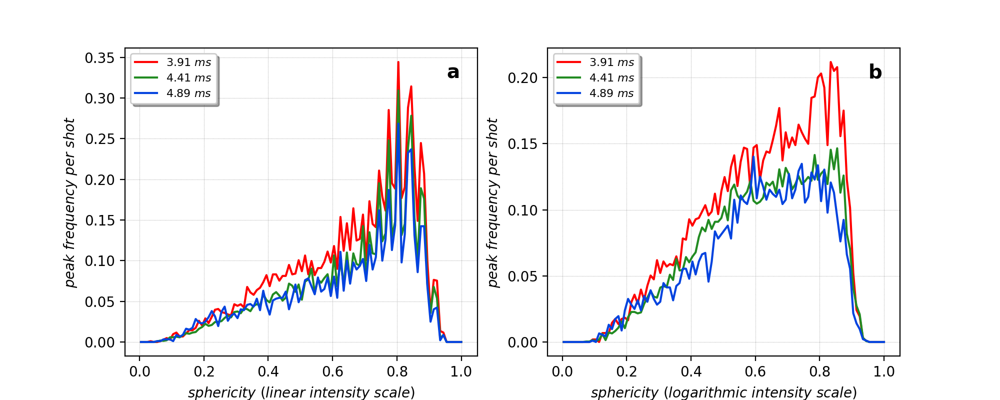

In [106]:
# area Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,4])
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # left side
binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(dict_all_w_s_ots, bins=binedges)
yhist_m, bin_edges_m = np.histogram(dict_all_m_s_ots, bins=binedges)
yhist_c, bin_edges_c = np.histogram(dict_all_c_s_ots, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(dict_all_w_s_log, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(dict_all_m_s_log, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(dict_all_c_s_log, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_dict_all_w.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_dict_all_m.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_dict_all_c.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_dict_all_w.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_dict_all_m.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_dict_all_c.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)

ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax2.set_title('Above 50 ADUs, log-Otsu method')
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS1.pdf', format='pdf')
plt.show()  

In [109]:
# intensity with different methods 
dict_all_w_i_ots = [list(d_values(dict_all_w, 3))[x]['Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_i_ots = [list(d_values(dict_all_m, 3))[x]['Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_i_ots = [list(d_values(dict_all_c, 3))[x]['Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_c, 3))))]

dict_all_w_i_log = [list(d_values(dict_all_w, 3))[x]['log-Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_w, 3))))]
dict_all_m_i_log = [list(d_values(dict_all_m, 3))[x]['log-Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_m, 3))))]
dict_all_c_i_log = [list(d_values(dict_all_c, 3))[x]['log-Otsu_max_intensity'] for x in range(len(list(d_values(dict_all_c, 3))))]


<IPython.core.display.Javascript object>


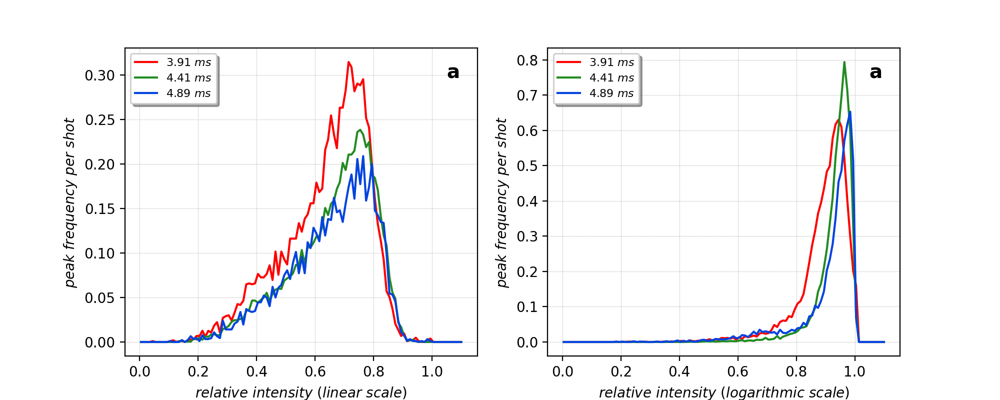

In [112]:
# max I with Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,4])
ax1 = fig.add_subplot(121)  # left side
ax2 = fig.add_subplot(122)  # left side
binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.1+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(dict_all_w_i_ots, bins=binedges)
yhist_m, bin_edges_m = np.histogram(dict_all_m_i_ots, bins=binedges)
yhist_c, bin_edges_c = np.histogram(dict_all_c_i_ots, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(list(filter(None, dict_all_w_i_log)), bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(list(filter(None, dict_all_m_i_log)), bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(list(filter(None, dict_all_c_i_log)), bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_i_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_i_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_i_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_i_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_i_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_i_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

T_229, = ax1.plot(new_bins, (new_i_w/pershot_dict_all_w.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_i_m/pershot_dict_all_m.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_i_c/pershot_dict_all_c.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins, (new_i_w_log/pershot_dict_all_w.sum()), color='r')
T_228_1, = ax2.plot(new_bins, (new_i_m_log/pershot_dict_all_m.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins, (new_i_c_log/pershot_dict_all_c.sum()), color='#0343DF')



ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$relative\ intensity\ (linear\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$relative\ intensity\ (logarithmic\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#ax1.set_xlim(0.5, 600)
#ax2.set_xlim(0.5, 600)
#ax2.set_title('Above 50 ADUs, log-Otsu method')
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'a', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS2.pdf', format='pdf')
plt.show()  

In [113]:
min_bound = iceIh_peaks()[0]-0.05
max_bound = iceIh_peaks()[0]+0.05

filterout_w_abv_s_100 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_100 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_100 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [114]:
min_bound = iceIh_peaks()[0]-0.05
max_bound = iceIh_peaks()[0]+0.05

filterout_w_blw_s_100 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_100 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_100 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [115]:
min_bound = iceIh_peaks()[1]-0.05
max_bound = iceIh_peaks()[1]+0.05

filterout_w_abv_s_002 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_002 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_002 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [116]:
min_bound = iceIh_peaks()[1]-0.05
max_bound = iceIh_peaks()[1]+0.05

filterout_w_blw_s_002 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_002 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_002 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [117]:
min_bound = iceIh_peaks()[2]-0.05
max_bound = iceIh_peaks()[2]+0.05

filterout_w_abv_s_101 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_101 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_101 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [118]:
min_bound = iceIh_peaks()[2]-0.05
max_bound = iceIh_peaks()[2]+0.05

filterout_w_blw_s_101 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_101 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_101 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [119]:
min_bound = iceIh_peaks()[3]-0.05
max_bound = iceIh_peaks()[3]+0.05

filterout_w_abv_s_102 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_102 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_102 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [120]:
min_bound = iceIh_peaks()[3]-0.05
max_bound = iceIh_peaks()[3]+0.05

filterout_w_blw_s_102 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_102 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_102 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [121]:
min_bound = iceIh_peaks()[4]-0.05
max_bound = iceIh_peaks()[4]+0.05

filterout_w_abv_s_110 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_110 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_110 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [124]:
min_bound = iceIh_peaks()[4]-0.05
max_bound = iceIh_peaks()[4]+0.05

filterout_w_blw_s_110 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_110 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_110 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [125]:
min_bound = iceIh_peaks()[5]-0.05
max_bound = iceIh_peaks()[5]+0.05

filterout_w_abv_s_103 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_103 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_103 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [126]:
min_bound = iceIh_peaks()[5]-0.05
max_bound = iceIh_peaks()[5]+0.05

filterout_w_blw_s_103 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_103 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_103 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [127]:
min_bound = iceIh_peaks()[6]-0.05
max_bound = iceIh_peaks()[8]+0.05

filterout_w_abv_s_201 = Shot_for_sp(T_w, above_50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_abv_s_201 = Shot_for_sp(T_m, above_50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_abv_s_201 = Shot_for_sp(T_c, above_50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [128]:
min_bound = iceIh_peaks()[6]-0.05
max_bound = iceIh_peaks()[8]+0.05

filterout_w_blw_s_201 = Shot_for_sp(T_w, below50ADUs_w, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_m_blw_s_201 = Shot_for_sp(T_m, below50ADUs_m, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)
filterout_c_blw_s_201 = Shot_for_sp(T_c, below50ADUs_c, choice = 'large_peaks', lower_qcm= min_bound, upper_qcm= max_bound)

In [129]:
abv_w_ots_100 = [list(d_values(filterout_w_abv_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_100, 3))))]
abv_m_ots_100 = [list(d_values(filterout_m_abv_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_100, 3))))]
abv_c_ots_100 = [list(d_values(filterout_c_abv_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_100, 3))))]

abv_w_log_100 = [list(d_values(filterout_w_abv_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_100, 3))))]
abv_m_log_100 = [list(d_values(filterout_m_abv_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_100, 3))))]
abv_c_log_100 = [list(d_values(filterout_c_abv_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_100, 3))))]

In [130]:
blw_w_ots_100 = [list(d_values(filterout_w_blw_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_100, 3))))]
blw_m_ots_100 = [list(d_values(filterout_m_blw_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_100, 3))))]
blw_c_ots_100 = [list(d_values(filterout_c_blw_s_100, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_100, 3))))]

blw_w_log_100 = [list(d_values(filterout_w_blw_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_100, 3))))]
blw_m_log_100 = [list(d_values(filterout_m_blw_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_100, 3))))]
blw_c_log_100 = [list(d_values(filterout_c_blw_s_100, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_100, 3))))]

In [131]:
abv_w_ots_002 = [list(d_values(filterout_w_abv_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_002, 3))))]
abv_m_ots_002 = [list(d_values(filterout_m_abv_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_002, 3))))]
abv_c_ots_002 = [list(d_values(filterout_c_abv_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_002, 3))))]

abv_w_log_002 = [list(d_values(filterout_w_abv_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_002, 3))))]
abv_m_log_002 = [list(d_values(filterout_m_abv_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_002, 3))))]
abv_c_log_002 = [list(d_values(filterout_c_abv_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_002, 3))))]

In [132]:
blw_w_ots_002 = [list(d_values(filterout_w_blw_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_002, 3))))]
blw_m_ots_002 = [list(d_values(filterout_m_blw_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_002, 3))))]
blw_c_ots_002 = [list(d_values(filterout_c_blw_s_002, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_002, 3))))]

blw_w_log_002 = [list(d_values(filterout_w_blw_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_002, 3))))]
blw_m_log_002 = [list(d_values(filterout_m_blw_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_002, 3))))]
blw_c_log_002 = [list(d_values(filterout_c_blw_s_002, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_002, 3))))]

In [133]:
abv_w_ots_101 = [list(d_values(filterout_w_abv_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_101, 3))))]
abv_m_ots_101 = [list(d_values(filterout_m_abv_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_101, 3))))]
abv_c_ots_101 = [list(d_values(filterout_c_abv_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_101, 3))))]

abv_w_log_101 = [list(d_values(filterout_w_abv_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_101, 3))))]
abv_m_log_101 = [list(d_values(filterout_m_abv_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_101, 3))))]
abv_c_log_101 = [list(d_values(filterout_c_abv_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_101, 3))))]

In [134]:
blw_w_ots_101 = [list(d_values(filterout_w_blw_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_101, 3))))]
blw_m_ots_101 = [list(d_values(filterout_m_blw_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_101, 3))))]
blw_c_ots_101 = [list(d_values(filterout_c_blw_s_101, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_101, 3))))]

blw_w_log_101 = [list(d_values(filterout_w_blw_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_101, 3))))]
blw_m_log_101 = [list(d_values(filterout_m_blw_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_101, 3))))]
blw_c_log_101 = [list(d_values(filterout_c_blw_s_101, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_101, 3))))]

In [135]:
np.mean(blw_w_ots_201), np.std(blw_w_ots_201),np.mean(blw_m_ots_201), np.std(blw_m_ots_201),np.mean(blw_c_ots_201), np.std(blw_c_ots_201)

NameError: name 'blw_w_ots_201' is not defined

In [136]:
abv_w_ots_102 = [list(d_values(filterout_w_abv_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_102, 3))))]
abv_m_ots_102 = [list(d_values(filterout_m_abv_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_102, 3))))]
abv_c_ots_102 = [list(d_values(filterout_c_abv_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_102, 3))))]

abv_w_log_102 = [list(d_values(filterout_w_abv_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_102, 3))))]
abv_m_log_102 = [list(d_values(filterout_m_abv_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_102, 3))))]
abv_c_log_102 = [list(d_values(filterout_c_abv_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_102, 3))))]

In [137]:
blw_w_ots_102 = [list(d_values(filterout_w_blw_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_102, 3))))]
blw_m_ots_102 = [list(d_values(filterout_m_blw_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_102, 3))))]
blw_c_ots_102 = [list(d_values(filterout_c_blw_s_102, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_102, 3))))]

blw_w_log_102 = [list(d_values(filterout_w_blw_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_102, 3))))]
blw_m_log_102 = [list(d_values(filterout_m_blw_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_102, 3))))]
blw_c_log_102 = [list(d_values(filterout_c_blw_s_102, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_102, 3))))]

In [138]:
abv_w_ots_110 = [list(d_values(filterout_w_abv_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_110, 3))))]
abv_m_ots_110 = [list(d_values(filterout_m_abv_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_110, 3))))]
abv_c_ots_110 = [list(d_values(filterout_c_abv_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_110, 3))))]

abv_w_log_110 = [list(d_values(filterout_w_abv_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_110, 3))))]
abv_m_log_110 = [list(d_values(filterout_m_abv_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_110, 3))))]
abv_c_log_110 = [list(d_values(filterout_c_abv_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_110, 3))))]

In [139]:
blw_w_ots_110 = [list(d_values(filterout_w_blw_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_110, 3))))]
blw_m_ots_110 = [list(d_values(filterout_m_blw_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_110, 3))))]
blw_c_ots_110 = [list(d_values(filterout_c_blw_s_110, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_110, 3))))]

blw_w_log_110 = [list(d_values(filterout_w_blw_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_110, 3))))]
blw_m_log_110 = [list(d_values(filterout_m_blw_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_110, 3))))]
blw_c_log_110 = [list(d_values(filterout_c_blw_s_110, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_110, 3))))]

In [140]:
abv_w_ots_103 = [list(d_values(filterout_w_abv_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_103, 3))))]
abv_m_ots_103 = [list(d_values(filterout_m_abv_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_103, 3))))]
abv_c_ots_103 = [list(d_values(filterout_c_abv_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_103, 3))))]

abv_w_log_103 = [list(d_values(filterout_w_abv_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_103, 3))))]
abv_m_log_103 = [list(d_values(filterout_m_abv_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_103, 3))))]
abv_c_log_103 = [list(d_values(filterout_c_abv_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_103, 3))))]

In [141]:
blw_w_ots_103 = [list(d_values(filterout_w_blw_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_103, 3))))]
blw_m_ots_103 = [list(d_values(filterout_m_blw_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_103, 3))))]
blw_c_ots_103 = [list(d_values(filterout_c_blw_s_103, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_103, 3))))]

blw_w_log_103 = [list(d_values(filterout_w_blw_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_103, 3))))]
blw_m_log_103 = [list(d_values(filterout_m_blw_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_103, 3))))]
blw_c_log_103 = [list(d_values(filterout_c_blw_s_103, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_103, 3))))]

In [142]:
abv_w_ots_201 = [list(d_values(filterout_w_abv_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_201, 3))))]
abv_m_ots_201 = [list(d_values(filterout_m_abv_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_201, 3))))]
abv_c_ots_201 = [list(d_values(filterout_c_abv_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_201, 3))))]

abv_w_log_201 = [list(d_values(filterout_w_abv_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_abv_s_201, 3))))]
abv_m_log_201 = [list(d_values(filterout_m_abv_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_abv_s_201, 3))))]
abv_c_log_201 = [list(d_values(filterout_c_abv_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_abv_s_201, 3))))]

In [143]:
blw_w_ots_201 = [list(d_values(filterout_w_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_201, 3))))]
blw_m_ots_201 = [list(d_values(filterout_m_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_201, 3))))]
blw_c_ots_201 = [list(d_values(filterout_c_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_201, 3))))]

blw_w_log_201 = [list(d_values(filterout_w_blw_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_w_blw_s_201, 3))))]
blw_m_log_201 = [list(d_values(filterout_m_blw_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_m_blw_s_201, 3))))]
blw_c_log_201 = [list(d_values(filterout_c_blw_s_201, 3))[x]['log-Otsu_sphericity'] for x in range(len(list(d_values(filterout_c_blw_s_201, 3))))]

In [144]:
aw = [list(filterout_w_abv_s_100[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_100 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [145]:
len(abv_c_ots_201)

332

In [146]:
aw = [list(filterout_m_abv_s_100[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_100 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [147]:
aw = [list(filterout_c_abv_s_100[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_100 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [148]:
aw = [list(filterout_w_abv_s_002[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_002 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [149]:
aw = [list(filterout_m_abv_s_002[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_002 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [150]:
aw = [list(filterout_c_abv_s_002[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_002 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [151]:
aw = [list(filterout_w_abv_s_101[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_101 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [152]:
aw = [list(filterout_m_abv_s_101[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_101 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [153]:
aw = [list(filterout_c_abv_s_101[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_101 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [154]:
aw = [list(filterout_w_abv_s_102[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_102 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [155]:
aw = [list(filterout_m_abv_s_102[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_102 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [156]:
aw = [list(filterout_c_abv_s_102[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_102 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [157]:
aw = [list(filterout_w_abv_s_110[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_110 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [158]:
aw = [list(filterout_m_abv_s_110[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_110 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [159]:
aw = [list(filterout_c_abv_s_110[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_110 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [160]:
aw = [list(filterout_w_abv_s_103[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_103 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [161]:
aw = [list(filterout_m_abv_s_103[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_103 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [162]:
aw = [list(filterout_c_abv_s_103[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_103 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [163]:
aw = [list(filterout_w_abv_s_201[run].keys()) for run in T_w]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_abv_s_201 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [164]:
aw = [list(filterout_m_abv_s_201[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_abv_s_201 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [165]:
aw = [list(filterout_c_abv_s_201[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_abv_s_201 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [166]:
aw = [list(filterout_w_blw_s_100[run].keys()) for run in T_w if run in filterout_w_blw_s_100.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_100 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [167]:
aw = [list(filterout_m_blw_s_100[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_100 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [168]:
aw = [list(filterout_c_blw_s_100[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_100 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [169]:
aw = [list(filterout_w_blw_s_002[run].keys()) for run in T_w if run in filterout_w_blw_s_002.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_002 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [170]:
aw = [list(filterout_m_blw_s_002[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_002 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [171]:
aw = [list(filterout_c_blw_s_002[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_002 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [172]:
aw = [list(filterout_w_blw_s_101[run].keys()) for run in T_w if run in filterout_w_blw_s_101.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_101 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [173]:
aw = [list(filterout_m_blw_s_101[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_101 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [174]:
aw = [list(filterout_c_blw_s_101[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_101 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [175]:
aw = [list(filterout_w_blw_s_102[run].keys()) for run in T_w if run in filterout_w_blw_s_102.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_102 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [176]:
aw = [list(filterout_m_blw_s_102[run].keys()) for run in T_m if run in filterout_m_blw_s_102.keys()] 
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_102 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [177]:
aw = [list(filterout_c_blw_s_102[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_102 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [178]:
aw = [list(filterout_w_blw_s_110[run].keys()) for run in T_w if run in filterout_w_blw_s_110.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_110 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [179]:
aw = [list(filterout_m_blw_s_110[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_110 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [180]:
aw = [list(filterout_c_blw_s_110[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_110 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [181]:
aw = [list(filterout_w_blw_s_103[run].keys()) for run in T_w if run in filterout_w_blw_s_103.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_103 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [182]:
aw = [list(filterout_m_blw_s_103[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_103 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [183]:
aw = [list(filterout_c_blw_s_103[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_103 = np.array([len([s for s in fg if n in s]) for n in T_c])

In [184]:
aw = [list(filterout_w_blw_s_201[run].keys()) for run in T_w if run in filterout_w_blw_s_201.keys()]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_w_blw_s_201 = np.array([len([s for s in fg if n in s]) for n in T_w])

In [185]:
aw = [list(filterout_m_blw_s_201[run].keys()) for run in T_m]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_m_blw_s_201 = np.array([len([s for s in fg if n in s]) for n in T_m])

In [186]:
aw = [list(filterout_c_blw_s_201[run].keys()) for run in T_c]
fg = np.array(sorted(itertools.chain(*aw))).T
pershot_c_blw_s_201 = np.array([len([s for s in fg if n in s]) for n in T_c])

<IPython.core.display.Javascript object>


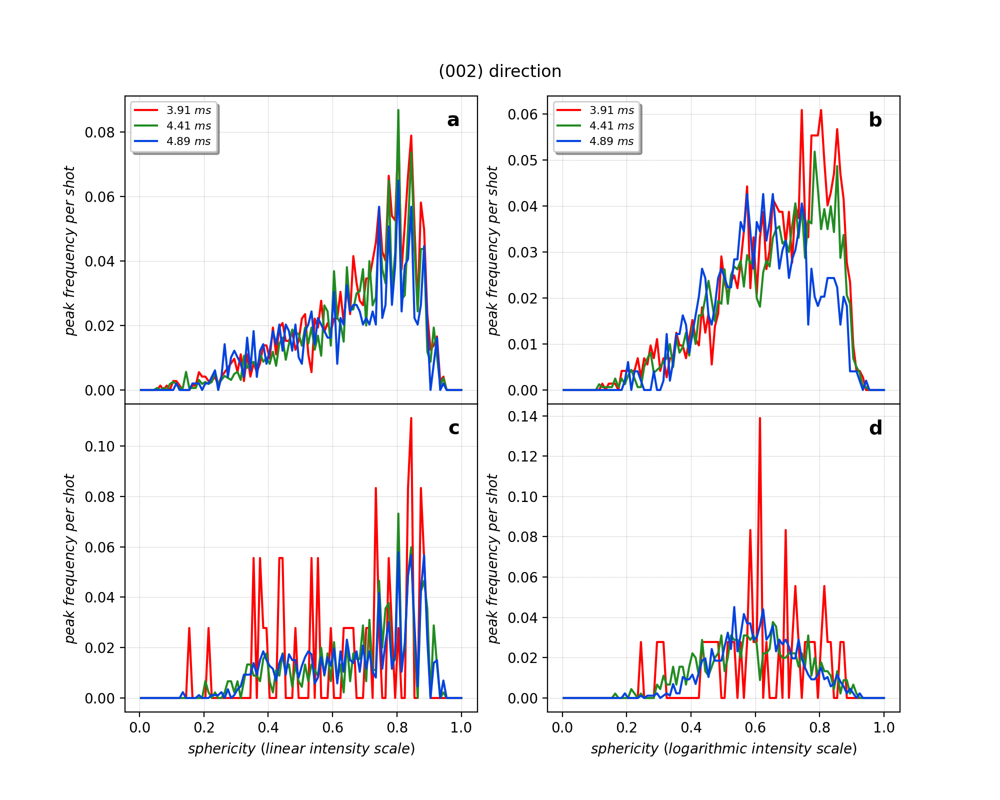

In [187]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_002, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_002, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_002, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_002, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_002, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_002, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_002, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_002, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_002, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_002, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_002, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_002, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_002.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_002.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_002.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_002.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_002.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_002.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_002.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_002.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_002.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_002.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_002.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_002.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(002) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_002.pdf', format='pdf')
plt.show()  

<IPython.core.display.Javascript object>


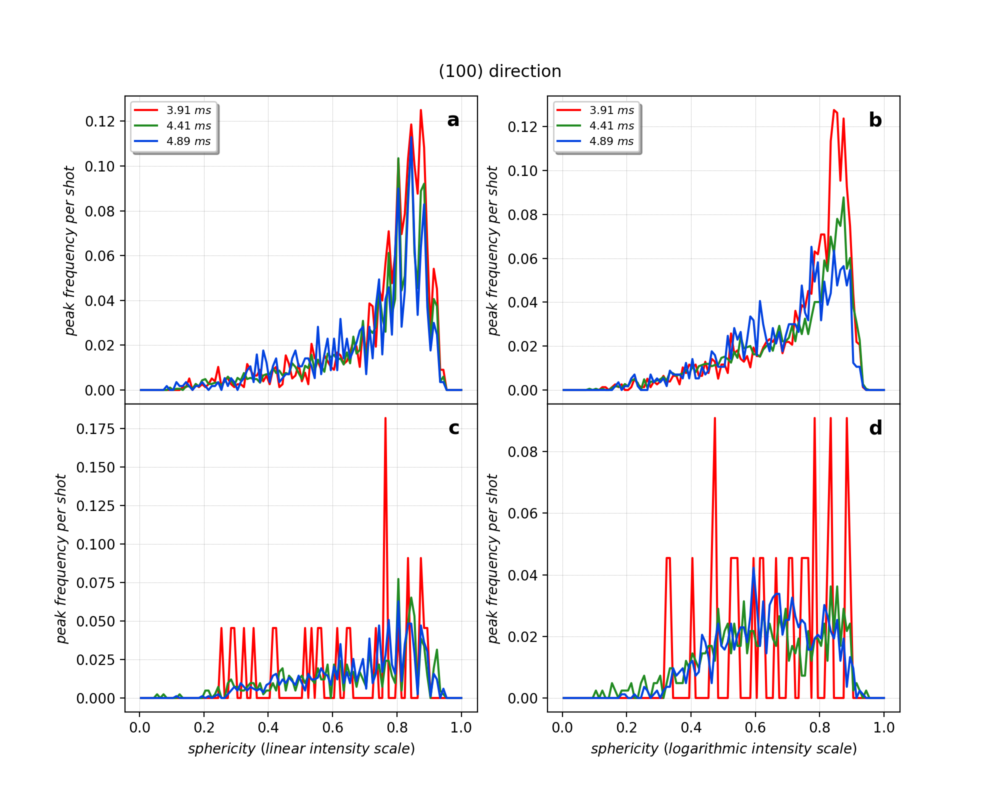

In [188]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_100, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_100, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_100, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_100, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_100, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_100, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_100, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_100, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_100, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_100, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_100, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_100, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_100.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_100.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_100.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_100.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_100.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_100.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_100.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_100.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_100.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_100.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_100.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_100.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(100) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_100.pdf', format='pdf')
plt.show()  
 

<IPython.core.display.Javascript object>


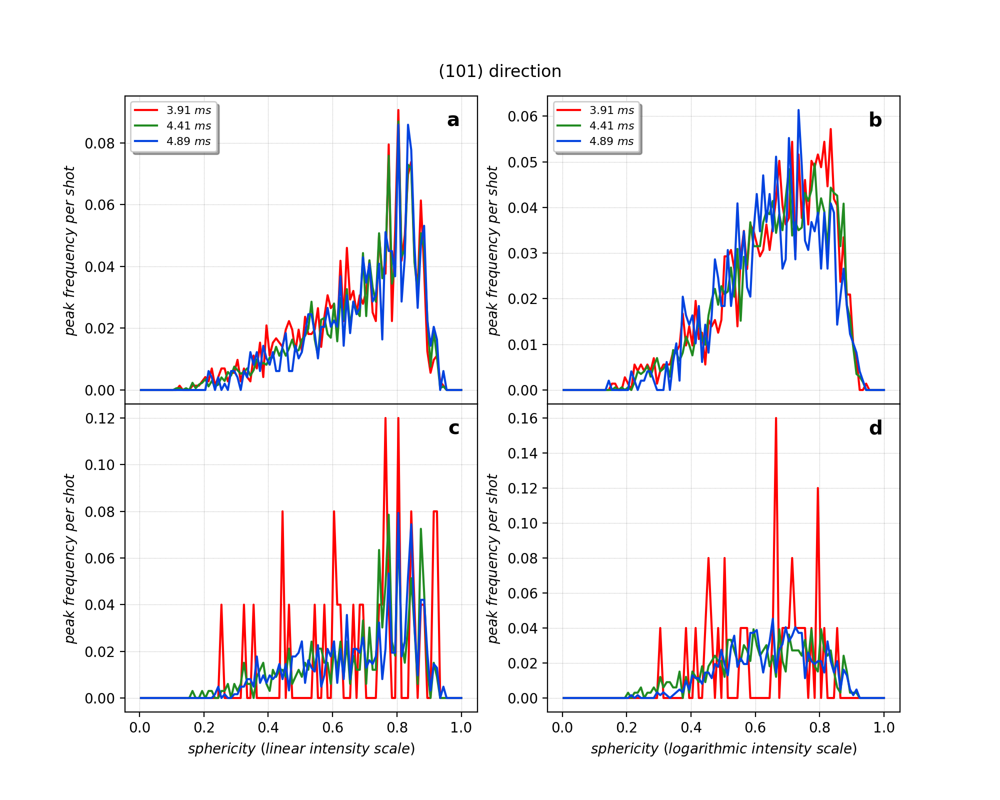

In [189]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_101, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_101, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_101, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_101, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_101, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_101, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_101, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_101, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_101, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_101, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_101, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_101, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_101.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_101.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_101.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_101.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_101.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_101.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_101.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_101.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_101.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_101.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_101.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_101.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(101) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_101.pdf', format='pdf')
plt.show()  

<IPython.core.display.Javascript object>


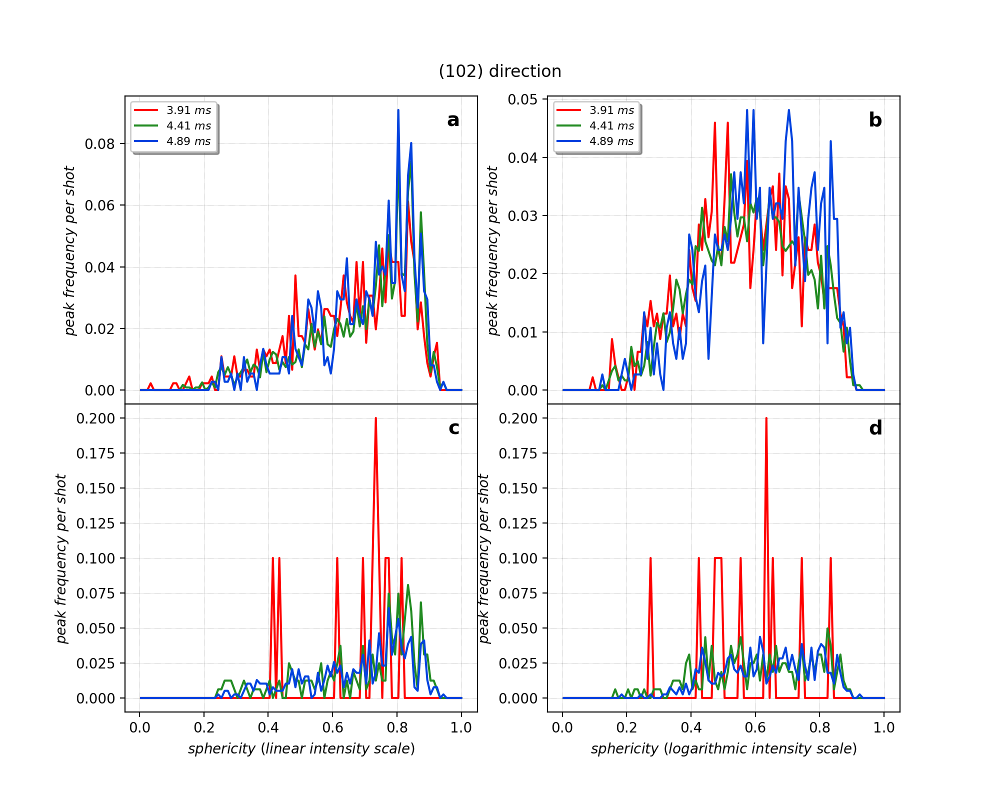

In [190]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_102, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_102, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_102, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_102, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_102, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_102, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_102, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_102, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_102, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_102, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_102, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_102, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_102.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_102.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_102.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_102.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_102.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_102.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_102.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_102.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_102.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_102.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_102.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_102.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(102) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_102.pdf', format='pdf')
plt.show()  


<IPython.core.display.Javascript object>


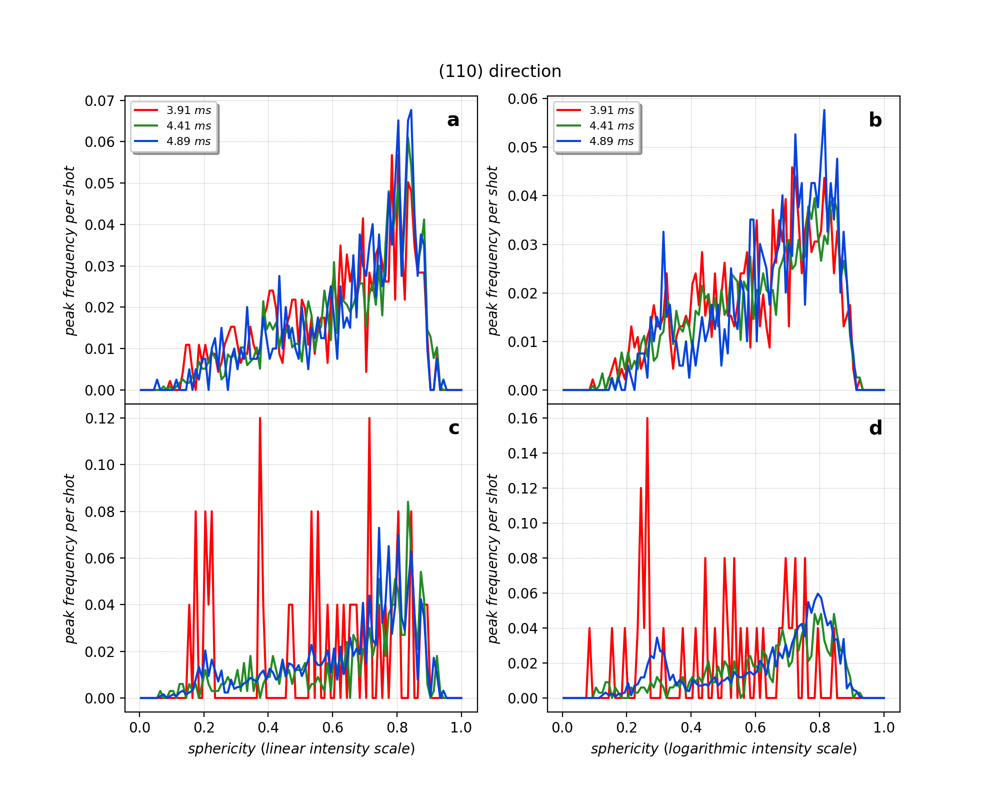

In [191]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_110, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_110, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_110, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_110, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_110, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_110, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_110, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_110, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_110, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_110, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_110, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_110, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_110.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_110.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_110.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_110.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_110.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_110.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_110.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_110.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_110.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_110.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_110.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_110.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(110) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_110.pdf', format='pdf')
plt.show()  


<IPython.core.display.Javascript object>


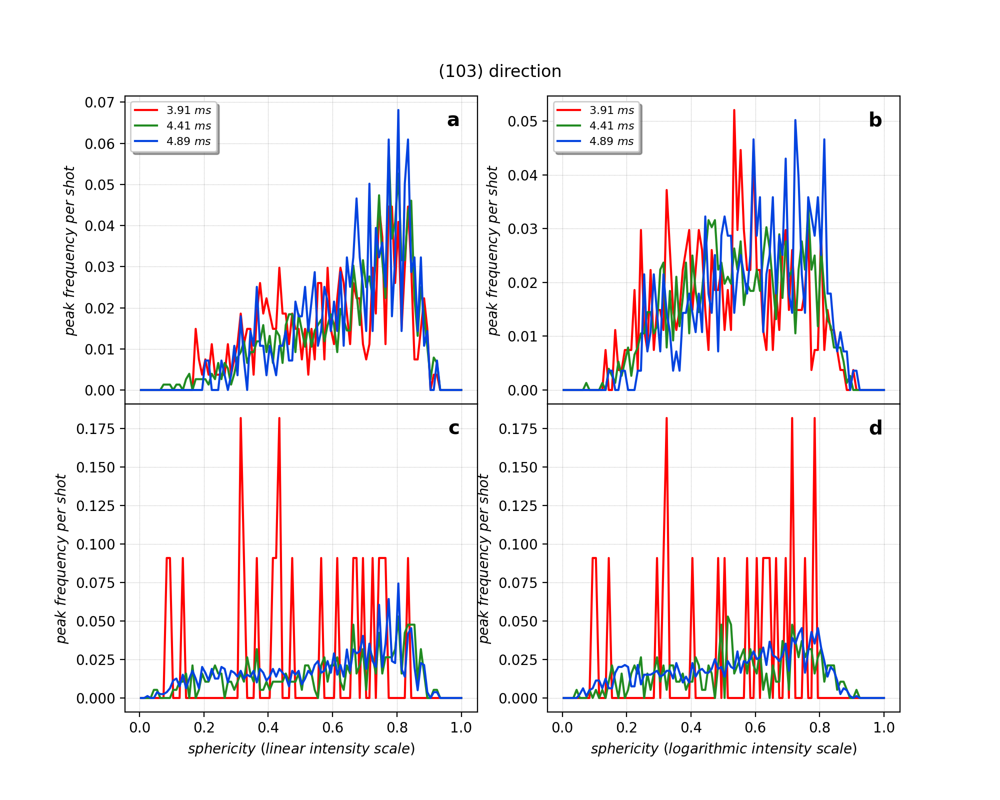

In [192]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_103, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_103, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_103, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_103, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_103, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_103, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_103, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_103, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_103, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_103, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_103, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_103, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_103.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_103.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_103.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_103.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_103.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_103.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_103.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_103.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_103.sum()), color='#0343DF')

T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_103.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_103.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_103.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(103) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_103.pdf', format='pdf')
plt.show()  


<IPython.core.display.Javascript object>


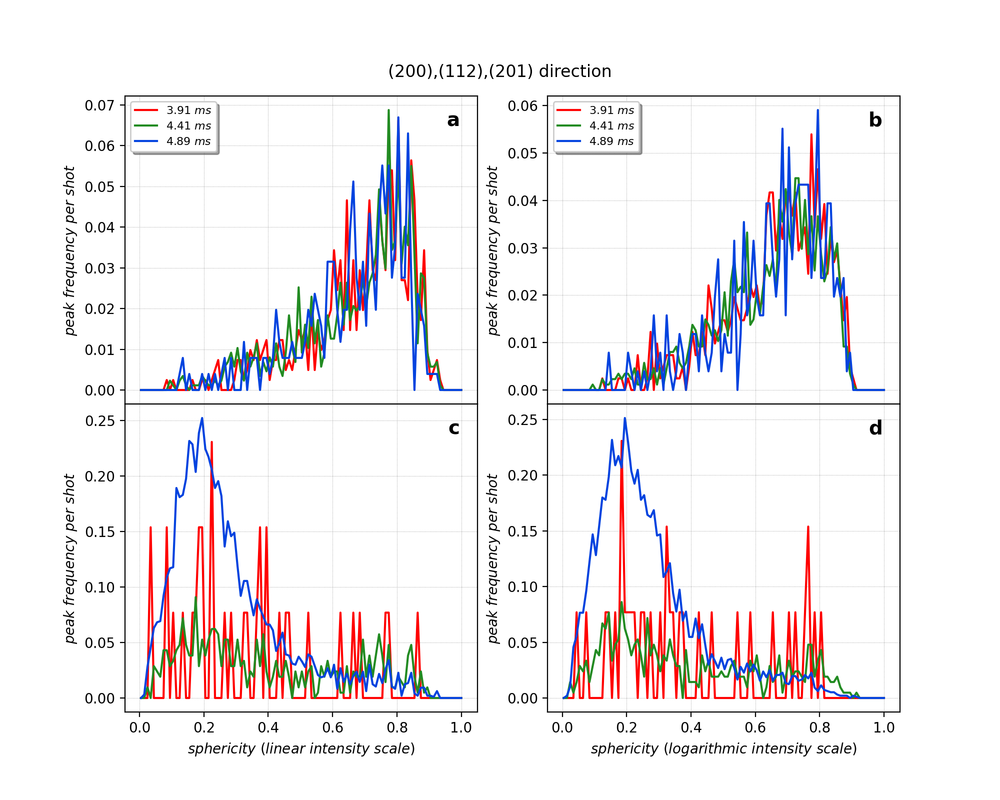

In [193]:
# sphericity Otsu vs log for all q_cm range whole dic 
fig = plt.figure(figsize = [10,8])
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(223, sharex=ax1)
ax4 = fig.add_subplot(224, sharex=ax2)# Remove horizontal space between axes
fig.subplots_adjust(hspace=0)

binwidth = 0.001
binedges = np.arange(0-binwidth/2,1.0+3*binwidth/2,binwidth)
yhist_w, bin_edges_w = np.histogram(abv_w_ots_201, bins=binedges)
yhist_m, bin_edges_m = np.histogram(abv_m_ots_201, bins=binedges)
yhist_c, bin_edges_c = np.histogram(abv_c_ots_201, bins=binedges)

yhist_w_log, bin_edges_w_log = np.histogram(abv_w_log_201, bins=binedges)
yhist_m_log, bin_edges_m_log = np.histogram(abv_m_log_201, bins=binedges)
yhist_c_log, bin_edges_c_log = np.histogram(abv_c_log_201, bins=binedges)

bin_centers1 = np.array([(bin_edges_w[i] + bin_edges_w[i+1])/2 for i in range(len(bin_edges_w)-1)])
bin_centers2 = np.array([(bin_edges_m[i] + bin_edges_m[i+1])/2 for i in range(len(bin_edges_m)-1)])
bin_centers3 = np.array([(bin_edges_c[i] + bin_edges_c[i+1])/2 for i in range(len(bin_edges_c)-1)])

bin_centers1_log = np.array([(bin_edges_w_log[i] + bin_edges_w_log[i+1])/2 for i in range(len(bin_edges_w_log)-1)])
bin_centers2_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(bin_edges_m_log)-1)])
bin_centers3_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(bin_edges_c_log)-1)])

new_bins, new_s_w = downsample(bin_centers1, yhist_w, size=10)
new_bins, new_s_m = downsample(bin_centers2, yhist_m, size=10)
new_bins, new_s_c = downsample(bin_centers3, yhist_c, size=10)

new_bins_log, new_s_w_log = downsample(bin_centers1_log, yhist_w_log, size=10)
new_bins_log, new_s_m_log = downsample(bin_centers2_log, yhist_m_log, size=10)
new_bins_log, new_s_c_log = downsample(bin_centers3_log, yhist_c_log, size=10)

yhist_w_blw, blw_edges_w = np.histogram(blw_w_ots_201, bins=binedges)
yhist_m_blw, blw_edges_m = np.histogram(blw_m_ots_201, bins=binedges)
yhist_c_blw, blw_edges_c = np.histogram(blw_c_ots_201, bins=binedges)

yhist_w_blw_log, blw_edges_w_log = np.histogram(blw_w_log_201, bins=binedges)
yhist_m_blw_log, blw_edges_m_log = np.histogram(blw_m_log_201, bins=binedges)
yhist_c_blw_log, blw_edges_c_log = np.histogram(blw_c_log_201, bins=binedges)

bin_centers1_blw = np.array([(blw_edges_w[i] + blw_edges_w[i+1])/2 for i in range(len(blw_edges_w)-1)])
bin_centers2_blw = np.array([(blw_edges_m[i] + blw_edges_m[i+1])/2 for i in range(len(blw_edges_m)-1)])
bin_centers3_blw = np.array([(blw_edges_c[i] + blw_edges_c[i+1])/2 for i in range(len(blw_edges_c)-1)])

bin_centers1_blw_log = np.array([(blw_edges_w_log[i] + blw_edges_w_log[i+1])/2 for i in range(len(blw_edges_w_log)-1)])
bin_centers2_blw_log = np.array([(bin_edges_m_log[i] + bin_edges_m_log[i+1])/2 for i in range(len(blw_edges_m_log)-1)])
bin_centers3_blw_log = np.array([(bin_edges_c_log[i] + bin_edges_c_log[i+1])/2 for i in range(len(blw_edges_c_log)-1)])

new_bins_blw, new_s_w_blw = downsample(bin_centers1_blw, yhist_w_blw, size=10)
new_bins_blw, new_s_m_blw = downsample(bin_centers2_blw, yhist_m_blw, size=10)
new_bins_blw, new_s_c_blw = downsample(bin_centers3_blw, yhist_c_blw, size=10)

new_bins_log, new_s_w_blw_log = downsample(bin_centers1_blw_log, yhist_w_blw_log, size=10)
new_bins_log, new_s_m_blw_log = downsample(bin_centers2_blw_log, yhist_m_blw_log, size=10)
new_bins_log, new_s_c_blw_log = downsample(bin_centers3_blw_log, yhist_c_blw_log, size=10)

T_229, = ax1.plot(new_bins, (new_s_w/pershot_w_abv_s_201.sum()), color='r')
T_228, = ax1.plot(new_bins, (new_s_m/pershot_m_abv_s_201.sum()), color='forestgreen')
T_227, = ax1.plot(new_bins, (new_s_c/pershot_c_abv_s_201.sum()), color='#0343DF')

T_229_1, = ax2.plot(new_bins_log, (new_s_w_log/pershot_w_abv_s_201.sum()), color='r')
T_228_1, = ax2.plot(new_bins_log, (new_s_m_log/pershot_m_abv_s_201.sum()), color='forestgreen')
T_227_1, = ax2.plot(new_bins_log, (new_s_c_log/pershot_c_abv_s_201.sum()), color='#0343DF')

T_229_blw, = ax3.plot(new_bins, (new_s_w_blw/pershot_w_blw_s_201.sum()), color='r')
T_228_blw, = ax3.plot(new_bins, (new_s_m_blw/pershot_m_blw_s_201.sum()), color='forestgreen')
T_227_blw, = ax3.plot(new_bins, (new_s_c_blw/pershot_c_blw_s_201.sum()), color='#0343DF')


T_229_blw_1, = ax4.plot(new_bins_log, (new_s_w_blw_log/pershot_w_blw_s_201.sum()), color='r')
T_228_blw_1, = ax4.plot(new_bins_log, (new_s_m_blw_log/pershot_m_blw_s_201.sum()), color='forestgreen')
T_227_blw_1, = ax4.plot(new_bins_log, (new_s_c_blw_log/pershot_c_blw_s_201.sum()), color='#0343DF')


ax1.legend(handles=[T_229, T_228, T_227], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax1.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax1.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax1.set_title('Above 50 ADUs, Otsu method')
ax1.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax1.text(0.95, 0.95, 'a', transform=ax1.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')


ax2.legend(handles=[T_229_1, T_228_1, T_227_1], labels=['$3.91\ ms$', '$4.41\ ms$', '$4.89\ ms$'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax2.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax2.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
ax2.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax2.text(0.95, 0.95, 'b', transform=ax2.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax3.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax3.set_xlabel('$sphericity\ (linear\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax3.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax3.set_title('Above 50 ADUs, Otsu method')
ax3.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax3.text(0.95, 0.95, 'c', transform=ax3.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')

#ax4.legend(handles=[T_227, T_228, T_229], labels=['50 mm', '45 mm', '40 mm'], loc='upper left', prop={'size': 8}, fancybox=True, framealpha=1, shadow=True, borderpad=0.4)
ax4.set_xlabel('$sphericity\ (logarithmic\ intensity\ scale)$')
#plt.ylabel('$fraction$ $of$ $peaks\ (\%)$')
#plt.ylabel('$Number$ $of$ $peaks$')
ax4.set_ylabel('$peak\ frequency\ per\ shot$')
#plt.xlim(0.65, 1.)
#ax4.set_title('Above 50 ADUs, Otsu method')
ax4.grid(c = 'grey',linestyle=':', linewidth=0.3)
ax4.text(0.95, 0.95, 'd', transform=ax4.transAxes, fontsize=14, fontweight='bold', va='top', ha='right')
plt.suptitle('(200),(112),(201) direction',  y=0.92)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS3_201.pdf', format='pdf')
plt.show()  


In [1103]:
case4_w_blw_s_100 = filterTheDict_case1(filterout_w_blw_s_100, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_100 = filterTheDict_case1(filterout_m_blw_s_100, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_100 = filterTheDict_case1(filterout_c_blw_s_100, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1104]:
case4_w_blw_s_002 = filterTheDict_case1(filterout_w_blw_s_002, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_002 = filterTheDict_case1(filterout_m_blw_s_002, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_002 = filterTheDict_case1(filterout_c_blw_s_002, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)

In [1105]:
case4_w_blw_s_101 = filterTheDict_case1(filterout_w_blw_s_101, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_101 = filterTheDict_case1(filterout_m_blw_s_101, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_101 = filterTheDict_case1(filterout_c_blw_s_101, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1106]:
case4_w_blw_s_102 = filterTheDict_case1(filterout_w_blw_s_102, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_102 = filterTheDict_case1(filterout_m_blw_s_102, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_102 = filterTheDict_case1(filterout_c_blw_s_102, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1107]:
case4_w_blw_s_110 = filterTheDict_case1(filterout_w_blw_s_110, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_110 = filterTheDict_case1(filterout_m_blw_s_110, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_110 = filterTheDict_case1(filterout_c_blw_s_110, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1108]:
case4_w_blw_s_103 = filterTheDict_case1(filterout_w_blw_s_103, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_103 = filterTheDict_case1(filterout_m_blw_s_103, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_103 = filterTheDict_case1(filterout_c_blw_s_103, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1110]:
case4_w_blw_s_201 = filterTheDict_case1(filterout_w_blw_s_201, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_m_blw_s_201 = filterTheDict_case1(filterout_m_blw_s_201, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)
case4_c_blw_s_201 = filterTheDict_case1(filterout_c_blw_s_201, s_min_thr = 0, s_max_thr = 1.1, d_min_thr = 0, d_max_thr = 0.2)


In [1126]:
case4_blw201_w = [list(d_values(case4_w_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case4_w_blw_s_201, 3))))]
case4_blw201_m = [list(d_values(case4_m_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case4_m_blw_s_201, 3))))]
case4_blw201_c = [list(d_values(case4_c_blw_s_201, 3))[x]['Otsu_sphericity'] for x in range(len(list(d_values(case4_c_blw_s_201, 3))))]



In [1127]:
len(case4_blw201_w), len(case4_blw201_m), len(case4_blw201_c)

(2, 54, 699)

<IPython.core.display.Javascript object>


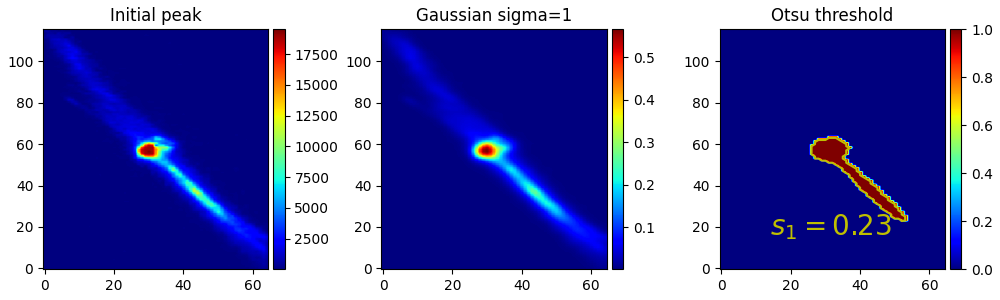

In [1169]:
regionx = specific_shots('r0168','LCLS_2011_Mar01_r0168_005054_14784_cspad')['peaks'][0]
regionx[np.where(regionx < 0)] = 0
blur = skimage.filters.gaussian(regionx, sigma=1)
t = skimage.filters.threshold_otsu(blur)
mask = blur > t
fill_holes = binary_fill_holes(mask)

contours,_= cv2.findContours(fill_holes.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
x_con = [contours[0][i][0][0] for i in range(len(contours[0]))]
y_con = [contours[0][i][0][1] for i in range(len(contours[0]))]
x_con.append(int(contours[0][0][0][0]))
y_con.append(int(contours[0][0][0][1]))


#p = fill_holes[peak_regions[0]]

fig = plt.figure(figsize = [10,3])
ax1 = fig.add_subplot(131)  # left side
ax2 = fig.add_subplot(132)  # right side
ax3 = fig.add_subplot(133) 

ax3.plot(x_con, y_con, 'y-')
ax3.text(contours[0][0][0][0]-38, contours[0][0][0][1]-7, '$s_1 = 0.23$', color = 'y', fontsize = 20)
im1 = ax1.imshow(regionx,cmap='jet', origin = 'lower', aspect='auto')
im2 = ax2.imshow(blur, cmap='jet', origin = 'lower', aspect='auto')
im3 = ax3.imshow(mask, cmap='jet', origin = 'lower', aspect='auto')

divider1 = make_axes_locatable(ax1)
divider2 = make_axes_locatable(ax2)
divider3 = make_axes_locatable(ax3)

cax1 = divider1.append_axes('right', size='5%', pad=0.05)
cax2 = divider2.append_axes('right', size='5%', pad=0.05)
cax3 = divider3.append_axes('right', size='5%', pad=0.05)

fig.colorbar(im1, cax=cax1, orientation='vertical')
fig.colorbar(im2, cax=cax2, orientation='vertical')
fig.colorbar(im3, cax=cax3, orientation='vertical')

ax1.set_title('Initial peak')
ax2.set_title('Gaussian sigma=1')
ax3.set_title('Otsu threshold')
#plt.clim(vmin=0,vmax=400)
fig.tight_layout(pad=0.5)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS5.pdf', format='pdf')
plt.show()

<IPython.core.display.Javascript object>


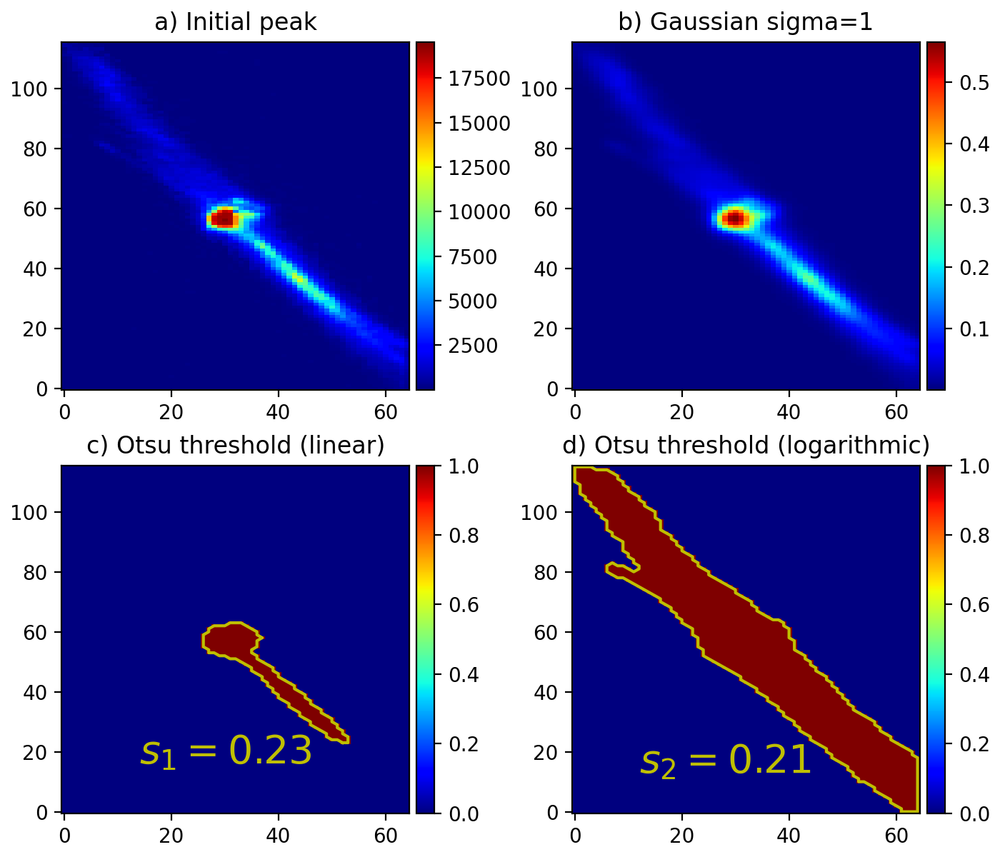

In [17]:
regionx = specific_shots('r0168','LCLS_2011_Mar01_r0168_005054_14784_cspad')['peaks'][0]
regionx[np.where(regionx < 0)] = 0
blur = skimage.filters.gaussian(regionx, sigma=1)
t2 = skimage.filters.threshold_otsu(np.nan_to_num(np.log(blur)))
mask2 = np.nan_to_num(np.log(blur)) > t2
fill_holes2 = binary_fill_holes(mask2)
contours2,_= cv2.findContours(fill_holes2.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

t = skimage.filters.threshold_otsu(blur)
mask = blur > t
fill_holes = binary_fill_holes(mask)

contours,_= cv2.findContours(fill_holes.astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
x_con = [contours[0][i][0][0] for i in range(len(contours[0]))]
y_con = [contours[0][i][0][1] for i in range(len(contours[0]))]
x_con.append(int(contours[0][0][0][0]))
y_con.append(int(contours[0][0][0][1]))

x_con2 = [contours2[0][i][0][0] for i in range(len(contours2[0]))]
y_con2 = [contours2[0][i][0][1] for i in range(len(contours2[0]))]
x_con2.append(int(contours2[0][0][0][0]))
y_con2.append(int(contours2[0][0][0][1]))


#p = fill_holes[peak_regions[0]]

fig = plt.figure(figsize = [7,6])
ax1 = fig.add_subplot(221)  # left side
ax2 = fig.add_subplot(222)  # right side
ax3 = fig.add_subplot(223)
ax4 = fig.add_subplot(224) 


ax3.plot(x_con, y_con, 'y-')
ax3.text(contours[0][0][0][0]-38, contours[0][0][0][1]-7, '$s_1 = 0.23$', color = 'y', fontsize = 20)
ax4.plot(x_con2, y_con2, 'y-')
ax4.text(contours[0][0][0][0]-40, contours[0][0][0][1]-10, '$s_2 = 0.21$', color = 'y', fontsize = 20)
im1 = ax1.imshow(regionx, cmap='jet', origin = 'lower', aspect='auto')
im2 = ax2.imshow(blur, cmap='jet', origin = 'lower', aspect='auto')
im3 = ax3.imshow(mask, cmap='jet', origin = 'lower', aspect='auto')
im4 = ax4.imshow(mask2, cmap='jet', origin = 'lower', aspect='auto')

divider1 = make_axes_locatable(ax1)
divider2 = make_axes_locatable(ax2)
divider3 = make_axes_locatable(ax3)
divider4 = make_axes_locatable(ax4)

cax1 = divider1.append_axes('right', size='5%', pad=0.05)
cax2 = divider2.append_axes('right', size='5%', pad=0.05)
cax3 = divider3.append_axes('right', size='5%', pad=0.05)
cax4 = divider4.append_axes('right', size='5%', pad=0.05)

fig.colorbar(im1, cax=cax1, orientation='vertical')
fig.colorbar(im2, cax=cax2, orientation='vertical')
fig.colorbar(im3, cax=cax3, orientation='vertical')
fig.colorbar(im4, cax=cax4, orientation='vertical')

ax1.set_title('a) Initial peak')
ax2.set_title('b) Gaussian sigma=1')
ax3.set_title('c) Otsu threshold (linear)')
ax4.set_title('d) Otsu threshold (logarithmic)')

#plt.clim(vmin=0,vmax=400)
fig.tight_layout(pad=0.5)
plt.savefig('/Users/niloo/Desktop/LCLS/14Dec2020/LCLS_files/LCLS_plots/FigS6.pdf', format='pdf')
plt.show()